# Coffee Leaf Diseases Classifier




<!DOCTYPE html>
<html lang=”en”>
   <body>
      <!--Centered Image Start-->
      <div style="text-align: center;">
         <img width="500" src="https://upload.wikimedia.org/wikipedia/commons/thumb/6/60/SDAIA-Logo-2.png/1200px-SDAIA-Logo-2.png" alt="Tuwaiq Academy">
      </div>

   </body>
</html>

<div style="text-align: center;">
     
<h2>Group Members</h2>
<h3>Salwa Bukhari (salwa.bukhari9@gmail.com) </h3>
<h3>Sara Alsadoun (SaraAlsadoun@hotmail.com)</h3>
<h3>Mussab Al-bargi (Albargi-454@hotmail.com) </h3>
<h3>Abdulrahman Ghazwani (d.m1999y@gmail.com)</h3>
<h3>Azzam Garwan (azzamgarwan0@gmail.com) </h3>

  </div>    
</body>
</html>

### Background
#### In a coffee plantation, the early detection of leaf diseases is crucial for maintaining a healthy crop and ensuring optimal coffee bean production. Traditional methods of disease identification are time-consuming and may lead to delayed intervention, impacting crop yield and quality. To address this challenge, an AI-based system is being developed for the early and accurate classification of coffee leaf diseases.


### Problem Statement
#### The goal is to create a classification model that can analyze images of coffee plant leaves and accurately identify whether they are affected by common diseases such as Rust, Scab, multiple diseases, or healthy. Early identification allows for timely intervention, reducing the spread of diseases and optimizing crop health.

### Import all Required Libraries

In [ ]:
import os
import shutil
from shutil import copyfile
import zipfile
import random

import tensorflow as tf
from tensorflow import keras
from tensorflow.keras.layers import Input
import matplotlib.pyplot as plt
from tensorflow.keras.preprocessing.image import ImageDataGenerator
import PIL
from tensorflow.keras.callbacks import EarlyStopping


### Mount to Google Colab

In [ ]:
from google.colab import drive
drive.mount('/content/drive')


Mounted at /content/drive


### Set All Constants

In [ ]:
batch_size = 32
img_height = 224
img_width = 224
validation_splits=0.2
learning_rates=0.0001
seeds=42
num_classes=4 # we have 4 classes  ['healthy', 'multiple_diseases', 'rust', 'scab']

### Data Split

In [ ]:
train_dataset_path = "/content/drive/MyDrive/Classifier2/Train"
validation_dataset_path = "/content/drive/MyDrive/Classifier2/validation"


train_ds = tf.keras.utils.image_dataset_from_directory(
    train_dataset_path,
    seed=seeds,
    image_size=(img_height, img_width),
    batch_size=batch_size,
    label_mode='categorical',
)

val_ds = tf.keras.utils.image_dataset_from_directory(
    validation_dataset_path,
    seed=seeds,
    image_size=(img_height, img_width),
    batch_size=batch_size,
    label_mode='categorical',

)

# Print information about the dataset sizes
early_stopping = EarlyStopping(
    monitor='val_loss',
    patience=3,
    restore_best_weights=True  # Restore model weights from the epoch with the best value of the monitored quantity
)

print()
train_size = train_ds.cardinality().numpy()

val_size = val_ds.cardinality().numpy()

print("Number of samples in the entire dataset:", train_size + val_size)
print("Number of samples in training dataset:", train_size)
print("Number of samples in validation dataset:", val_size)

print()
# Print class names for both training and validation datasets
class_names = train_ds.class_names
print("train classes : ",class_names)

class_names = val_ds.class_names
print("validation classes : " ,class_names)

Found 1459 files belonging to 4 classes.
Found 362 files belonging to 4 classes.

Number of samples in the entire dataset: 58
Number of samples in training dataset: 46
Number of samples in validation dataset: 12

train classes :  ['healthy', 'multiple_diseases', 'rust', 'scab']
validation classes :  ['healthy', 'multiple_diseases', 'rust', 'scab']


### Data Augmentation

In [ ]:
data_augmentation = tf.keras.Sequential([
    tf.keras.layers.RandomZoom(0.1),
    tf.keras.layers.RandomFlip("horizontal"),
    tf.keras.layers.RandomFlip("vertical"),
])

### Visualizing the first training batch

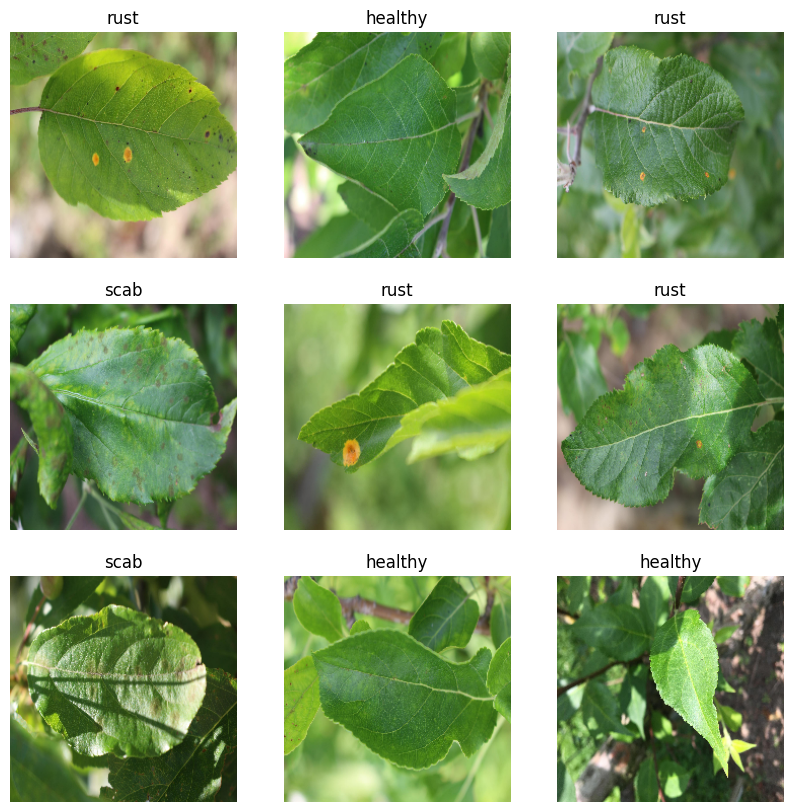

In [ ]:
# Create a figure with a 3x3 grid of subplots, each with a size of 10x10 inches
plt.figure(figsize=(10,10))

# Iterate through the first batch of the training dataset
for images, labels in train_ds.take(1):
    # Iterate through the first 9 images in the batch
    for i in range(9):
        # Create a subplot in the 3x3 grid
        ax = plt.subplot(3, 3, i + 1)

        # Display the image, converting it to a NumPy array and casting to uint8
        plt.imshow(images[i].numpy().astype("uint8"))

        # Get the class name corresponding to the one-hot encoded label
        # (Assumes one-hot encoding with a single '1' indicating the class)
        plt.title(class_names[list(labels[i]).index(1)])

        # Turn off axis labels for cleaner visualization
        plt.axis("off")

# Show the figure with the 3x3 grid of subplots
plt.show()


### Data preprocessing

In [ ]:
AUTOTUNE = tf.data.AUTOTUNE
# Cache the training dataset to improve data loading speed
# Shuffle the cached training dataset with a buffer size of 1459 (adjust as needed)
# Prefetch the shuffled training dataset to overlap data loading and model training
train_ds = train_ds.cache().shuffle(1459).prefetch(buffer_size=AUTOTUNE)
# Cache the validation dataset to improve data loading speed
# Prefetch the validation dataset to overlap data loading and model training
val_ds = val_ds.cache().prefetch(buffer_size=AUTOTUNE)

### Adjusting Class weights

In [ ]:

from pathlib import Path
dataset_path = Path("/content/drive/MyDrive/Classifier2/Train")

class_names = ['healthy', 'multiple_diseases', 'rust', 'scab']

num_images = {}
for class_name in class_names:
    num_images[class_name] = len(tuple((dataset_path / class_name).glob('*')))

total = sum(num_images.values())
class_weights = {
    label: (1 / num_images) * (total / 2.0)
    for label, num_images in enumerate(num_images.values())
}

print(num_images)

class_weights

{'healthy': 414, 'multiple_diseases': 73, 'rust': 498, 'scab': 474}


{0: 1.7620772946859902,
 1: 9.993150684931507,
 2: 1.4648594377510038,
 3: 1.5390295358649788}

## Model Building

In [ ]:
import tensorflow as tf
from tensorflow.keras import layers, models

def create_model():
    # Define the input layer with the specified shape
    input_layer = tf.keras.layers.Input(shape=(img_height, img_width, 3), name="input_layer")

    # Apply data augmentation (assuming data_augmentation is a predefined layer)
    data_augmentation,

    # Convolutional layers with relu activation and same padding
    conv1 = tf.keras.layers.Conv2D(64, (3, 3), activation="relu", padding="same")(input_layer)
    conv2 = tf.keras.layers.Conv2D(128, (3, 3), activation="relu", padding="same")(conv1)
    conv3 = tf.keras.layers.Conv2D(256, (3, 3), activation="relu", padding="same")(conv2)

    # Max pooling layer
    max_pooling = tf.keras.layers.MaxPooling2D((2, 2))(conv3)

    # Global average pooling layer
    global_avg_pooling = tf.keras.layers.GlobalAveragePooling2D()(max_pooling)

    # Dense layers with relu activation and dropout
    dense1 = tf.keras.layers.Dense(256, activation="relu")(global_avg_pooling)
    dropout1 = tf.keras.layers.Dropout(0.3)(dense1)

    dense2 = tf.keras.layers.Dense(512, activation="relu")(dropout1)
    dropout2 = tf.keras.layers.Dropout(0.3)(dense2)

    dense3 = tf.keras.layers.Dense(128, activation="relu")(dropout2)
    dropout3 = tf.keras.layers.Dropout(0.3)(dense3)

    # Output layer with softmax activation
    output_layer = tf.keras.layers.Dense(4, activation="softmax")(dropout3)

    # Create and return the model with defined input and output layers
    model = tf.keras.models.Model(inputs=input_layer, outputs=output_layer)

    return model


### Model summary

In [ ]:
base_model = create_model()

base_model.build(input_shape=(None, img_height, img_width, 3))

base_model.summary()

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_layer (InputLayer)    [(None, 224, 224, 3)]     0         
                                                                 
 conv2d (Conv2D)             (None, 224, 224, 64)      1792      
                                                                 
 conv2d_1 (Conv2D)           (None, 224, 224, 128)     73856     
                                                                 
 conv2d_2 (Conv2D)           (None, 224, 224, 256)     295168    
                                                                 
 max_pooling2d (MaxPooling2  (None, 112, 112, 256)     0         
 D)                                                              
                                                                 
 global_average_pooling2d (  (None, 256)               0         
 GlobalAveragePooling2D)                                     

### Model Compiling

In [ ]:
base_model.compile(loss="categorical_crossentropy",
                   optimizer=tf.keras.optimizers.Adam(learning_rate=learning_rates),
                   metrics=["accuracy"],
                   )

### Model Fitting

In [ ]:
base_history = base_model.fit(train_ds,
               epochs=30,
               verbose=1,
               validation_data=val_ds,
               class_weight=class_weights, # Apply class weights during training to handle class imbalance
               callbacks=[early_stopping]
                            )


Epoch 1/30
46/46 [==============================] - 259s 2s/step - loss: 1.9144 - accuracy: 0.3297 - val_loss: 1.2227 - val_accuracy: 0.3619
Epoch 2/30
46/46 [==============================] - 32s 695ms/step - loss: 1.3184 - accuracy: 0.3324 - val_loss: 1.2155 - val_accuracy: 0.4503
Epoch 3/30
46/46 [==============================] - 32s 694ms/step - loss: 1.2935 - accuracy: 0.3304 - val_loss: 1.2174 - val_accuracy: 0.3757
Epoch 4/30
46/46 [==============================] - 31s 684ms/step - loss: 1.2584 - accuracy: 0.3530 - val_loss: 1.1817 - val_accuracy: 0.4586
Epoch 5/30
46/46 [==============================] - 32s 694ms/step - loss: 1.2374 - accuracy: 0.3948 - val_loss: 1.1785 - val_accuracy: 0.4365
Epoch 6/30
46/46 [==============================] - 32s 690ms/step - loss: 1.2397 - accuracy: 0.3838 - val_loss: 1.1902 - val_accuracy: 0.4144
Epoch 7/30
46/46 [==============================] - 32s 692ms/step - loss: 1.2182 - accuracy: 0.3845 - val_loss: 1.1833 - val_accuracy: 0.4807
E

### Plotting the Accuracy and Loss

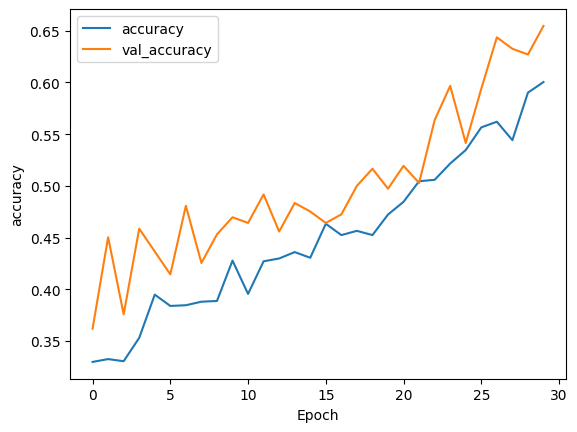

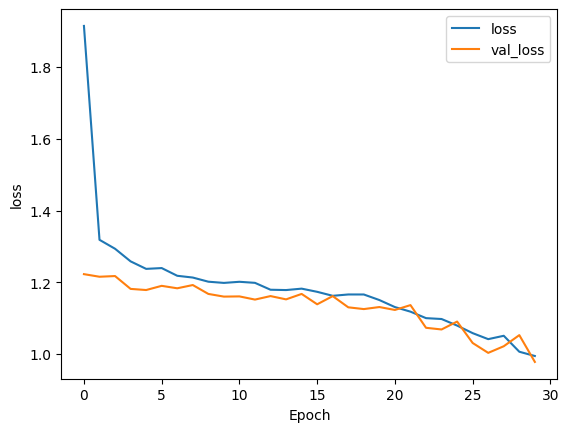

In [ ]:
def plot_result(plot_string, history):

  plt.plot(history.history[plot_string])
  plt.plot(history.history["val_" + plot_string])

  plt.xlabel("Epoch")
  plt.ylabel(plot_string)

  plt.legend([plot_string, "val_" + plot_string])

  plt.show()


plot_result("accuracy", history=base_history)
plot_result("loss", history=base_history)


### Transfer Learning

In [ ]:
incep_model = tf.keras.applications.inception_v3.InceptionV3(
    include_top=False,
    weights="imagenet",
    input_shape=(img_height, img_width, 3),
)

incep_model.trainable = False


In [ ]:
num_of_classes = 4
def transfer_learning_model():
  model = tf.keras.models.Sequential([
    incep_model,
    tf.keras.layers.Dropout(0.2),
    tf.keras.layers.GlobalAveragePooling2D(),
    tf.keras.layers.Dropout(0.2),
    tf.keras.layers.Dense(512, activation="relu"),
    tf.keras.layers.Dense(num_of_classes, activation="softmax")
  ])

  return model

In [ ]:
transfer_model = transfer_learning_model()

transfer_model.build(input_shape=(None, img_height, img_width, 3))


transfer_model.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 inception_v3 (Functional)   (None, 5, 5, 2048)        21802784  
                                                                 
 dropout_2 (Dropout)         (None, 5, 5, 2048)        0         
                                                                 
 global_average_pooling2d (  (None, 2048)              0         
 GlobalAveragePooling2D)                                         
                                                                 
 dropout_3 (Dropout)         (None, 2048)              0         
                                                                 
 dense_3 (Dense)             (None, 512)               1049088   
                                                                 
 dense_4 (Dense)             (None, 4)                 2052      
                                                      

### Compiling the Model

In [ ]:
transfer_model.compile(loss="categorical_crossentropy",
                   optimizer=tf.keras.optimizers.Adam(learning_rate=learning_rates),
                   metrics=["accuracy"]
                   )

### Train the model

In [ ]:
transfer_history = transfer_model.fit(train_ds,
               epochs=30,
               verbose=1,
               validation_data=val_ds,
               class_weight=class_weights,
               callbacks=[early_stopping]
                                      )

Epoch 1/30
46/46 [==============================] - 46s 335ms/step - loss: 2.0273 - accuracy: 0.6340 - val_loss: 3.3144 - val_accuracy: 0.4669
Epoch 2/30
46/46 [==============================] - 13s 288ms/step - loss: 0.3856 - accuracy: 0.9520 - val_loss: 0.9989 - val_accuracy: 0.8425
Epoch 3/30
46/46 [==============================] - 13s 292ms/step - loss: 0.0484 - accuracy: 0.9979 - val_loss: 0.6644 - val_accuracy: 0.8812
Epoch 4/30
46/46 [==============================] - 14s 297ms/step - loss: 0.0134 - accuracy: 0.9993 - val_loss: 0.5179 - val_accuracy: 0.8923
Epoch 5/30
46/46 [==============================] - 14s 301ms/step - loss: 0.0135 - accuracy: 0.9993 - val_loss: 0.4557 - val_accuracy: 0.9006
Epoch 6/30
46/46 [==============================] - 14s 308ms/step - loss: 0.0065 - accuracy: 0.9993 - val_loss: 0.4208 - val_accuracy: 0.8978
Epoch 7/30
46/46 [==============================] - 14s 304ms/step - loss: 0.0067 - accuracy: 0.9993 - val_loss: 0.4024 - val_accuracy: 0.8978

### Plotting Accuracy and Loss

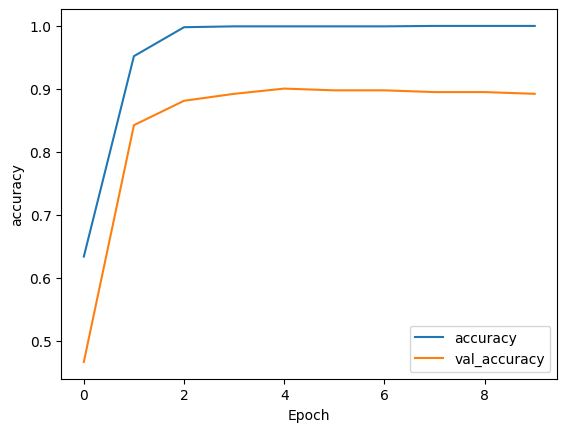

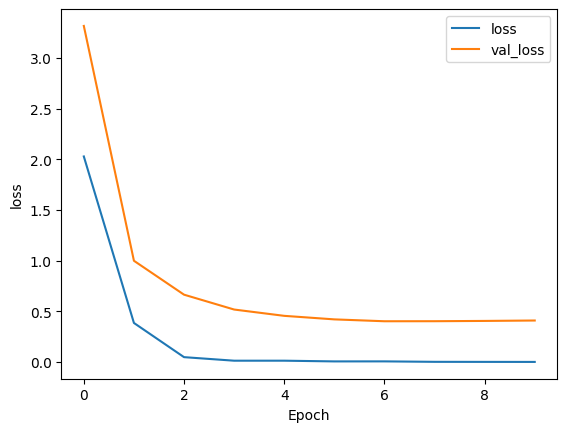

In [ ]:
def plot_result(plot_string, history):

  plt.plot(history.history[plot_string])
  plt.plot(history.history["val_" + plot_string])

  plt.xlabel("Epoch")
  plt.ylabel(plot_string)

  plt.legend([plot_string, "val_" + plot_string])

  plt.show()


plot_result("accuracy", history=transfer_history)
plot_result("loss", history=transfer_history)


### Visual Testing for prediction

1/1 [==============================] - 0s 30ms/step


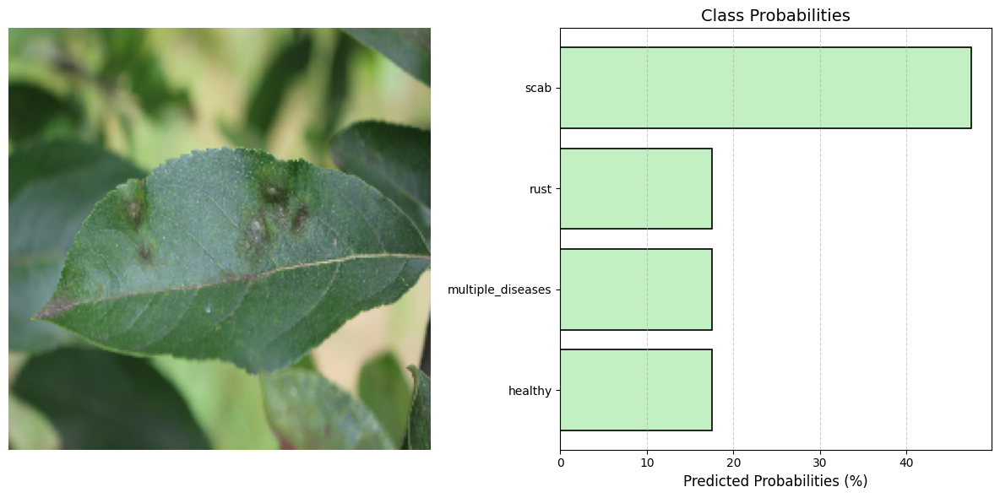

In [ ]:
from tensorflow.keras.preprocessing import image
import matplotlib.pyplot as plt
import numpy as np

filepath = "/content/drive/MyDrive/Classifier2/validation/scab/Train_119.jpg"

img = image.load_img(filepath, target_size=(img_height, img_width))

x = image.img_to_array(img)
x = np.expand_dims(x, axis=0)

predict = transfer_model.predict(x)

score = tf.nn.softmax(predict)

percentage_score = score * 100

class_names_flat = np.array(class_names).flatten()

light_green = '#c2f0c2'

plt.figure(figsize=(12, 6))

plt.subplot(1, 2, 1)
plt.imshow(img)
plt.axis('off')

plt.subplot(1, 2, 2)
plt.barh(class_names_flat, percentage_score[0], color=light_green, edgecolor='black', linewidth=1.2)
plt.xlabel('Predicted Probabilities (%)', fontsize=12)
plt.title('Class Probabilities', fontsize=14)
plt.xticks(fontsize=10)
plt.yticks(fontsize=10)
plt.grid(axis='x', linestyle='--', alpha=0.6)

plt.tight_layout()

plt.show()

### Classification Report

In [ ]:
import numpy as np
from sklearn.metrics import classification_report, confusion_matrix

# Lists to store true labels and predicted indices
true_labels = []
predicted_indices = []

# Iterate through the validation dataset
for images, labels in val_ds:
    # Convert one-hot encoded labels to class indices and extend the lists
    true_labels.extend(labels.numpy().argmax(axis=1))
    # Get predicted class indices and extend the list
    predictions = transfer_model.predict(images)
    predicted_indices.extend(np.argmax(predictions, axis=1))

# Convert lists to NumPy arrays
true_labels = np.array(true_labels)
predicted_indices = np.array(predicted_indices)

# Generate a classification report
report = classification_report(true_labels, predicted_indices)

# Print the classification report
print(report)


1/1 [==============================] - 0s 33ms/step
              precision    recall  f1-score   support

           0       0.87      0.93      0.90       102
           1       0.33      0.11      0.17        18
           2       0.96      0.95      0.96       124
           3       0.89      0.93      0.91       118

    accuracy                           0.90       362
   macro avg       0.76      0.73      0.73       362
weighted avg       0.88      0.90      0.89       362



### Plotting the Classification Report

1/1 [==============================] - 0s 33ms/step


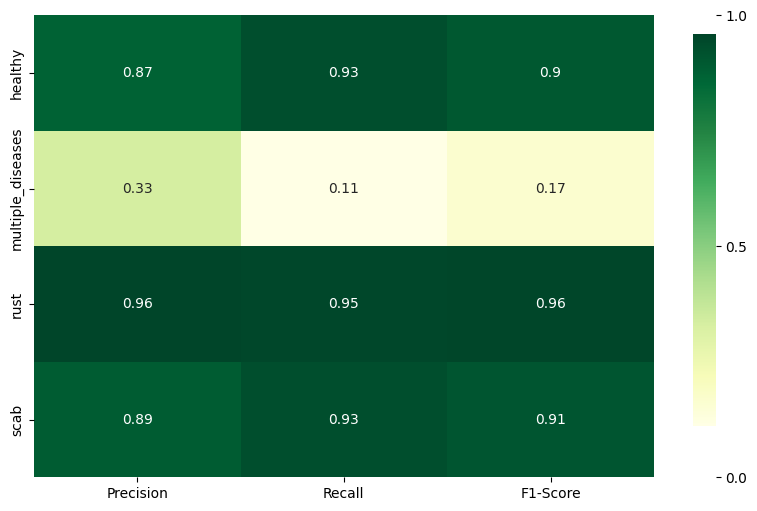

In [ ]:
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.metrics import classification_report

# List of class names (replace with your actual class names)
class_names = ['healthy', 'multiple_diseases', 'rust', 'scab']

# Lists to store true labels and predicted indices
true_labels = []
predicted_indices = []

# Iterate through the validation dataset
for images, labels in val_ds:
    # Convert one-hot encoded labels to class indices and extend the lists
    true_labels.extend(labels.numpy().argmax(axis=1))
    # Get predicted class indices and extend the list
    predictions = transfer_model.predict(images)
    predicted_indices.extend(np.argmax(predictions, axis=1))

# Convert lists to NumPy arrays
true_labels = np.array(true_labels)
predicted_indices = np.array(predicted_indices)

# Generate a classification report
report = classification_report(true_labels, predicted_indices, target_names=class_names, output_dict=True)

# Extract precision, recall, and F1-score values for each class
report_data = np.array([[float(v['precision']), float(v['recall']), float(v['f1-score'])] for k, v in report.items() if k in class_names])

# Create a heatmap using seaborn
fig, ax = plt.subplots(figsize=(10, 6))
# Annotate the heatmap with precision, recall, and F1-score values
cax = sns.heatmap(report_data, annot=True, cmap="YlGn", xticklabels=['Precision', 'Recall', 'F1-Score'], yticklabels=class_names, ax=ax)

# Set colorbar ticks
cbar = cax.collections[0].colorbar
cbar.set_ticks([0.0, 0.5, 1.0])
# Set colorbar tick labels
cbar.set_ticklabels(['0.0', '0.5', '1.0'])

# Display the heatmap
plt.show()


### Plotting the Confusion Matrix

1/1 [==============================] - 0s 28ms/step


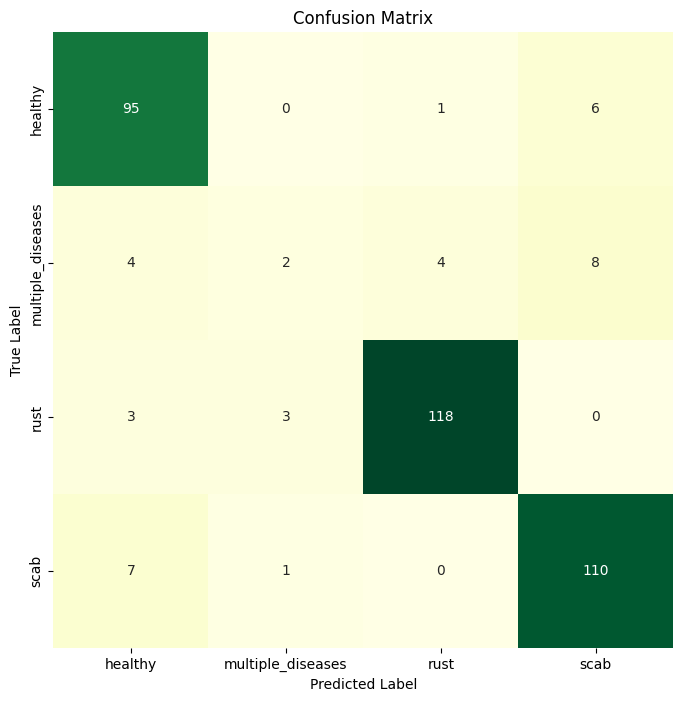

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import confusion_matrix
import numpy as np


def plot_confusion_matrix_heatmap(model, val_ds, threshold=0.5, class_names=['healthy', 'multiple_diseases', 'rust', 'scab']):
    plt.figure(figsize=(8, 8))

    y_true = []
    y_pred_probs = []

    for images, labels in val_ds:
        # Convert one-hot encoded labels to class indices and extend the lists
        y_true.extend(np.argmax(labels.numpy(), axis=1))
        # Get predicted class indices and extend the list
        y_pred_probs.extend(np.argmax(model.predict(images), axis=1))

    # Convert lists to NumPy arrays
    y_true = np.array(y_true)
    y_pred_probs = np.array(y_pred_probs)

    cm = confusion_matrix(y_true, y_pred_probs)

    sns.heatmap(cm, annot=True, fmt='d', cmap='YlGn', cbar=False,
                xticklabels=class_names,
                yticklabels=class_names)
    plt.xlabel('Predicted Label')
    plt.ylabel('True Label')
    plt.title('Confusion Matrix')

    plt.show()

class_names = ['healthy', 'multiple_diseases', 'rust', 'scab']
# Call the function to plot the confusion matrix heatmap
plot_confusion_matrix_heatmap(model=transfer_model, val_ds=val_ds, threshold=0.5, class_names=class_names)


### Plotting the ROC curve

1/1 [==============================] - 0s 32ms/step


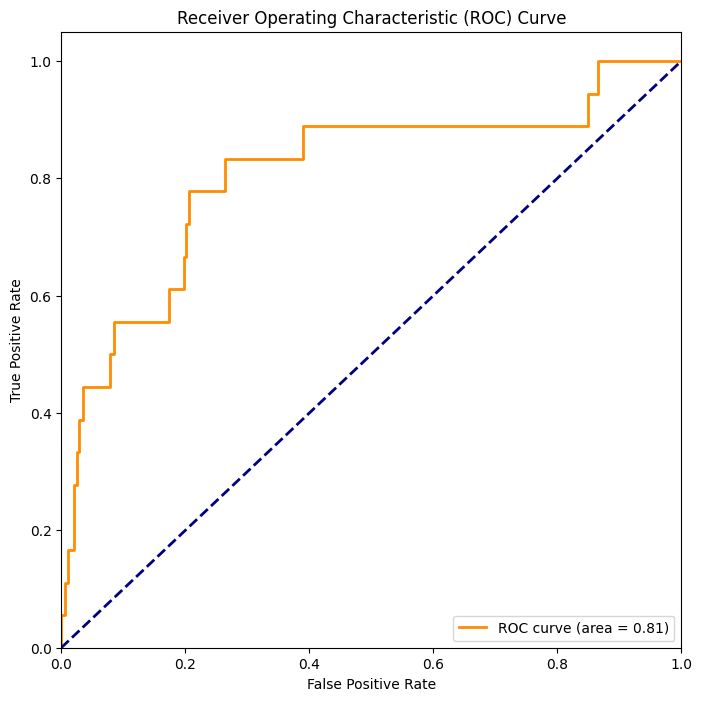

In [ ]:
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve, auc
import numpy as np

def plot_roc_curve(model, val_ds):
    plt.figure(figsize=(8, 8))

    y_true = []
    y_pred_probs = []

    for images, labels in val_ds:
        y_true.extend(labels.numpy())
        y_pred_probs.extend(model.predict(images).squeeze())

    y_true = np.array(y_true)
    y_pred_probs = np.array(y_pred_probs)

    fpr, tpr, thresholds = roc_curve(y_true[:, 1], y_pred_probs[:, 1])
    roc_auc = auc(fpr, tpr)

    plt.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve (area = {:.2f})'.format(roc_auc))
    plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('Receiver Operating Characteristic (ROC) Curve')
    plt.legend(loc="lower right")

    plt.show()

plot_roc_curve(model=transfer_model, val_ds=val_ds)


### Showcase Predictions and Confidence

Found 362 files belonging to 4 classes.
1/1 [==============================] - 0s 27ms/step


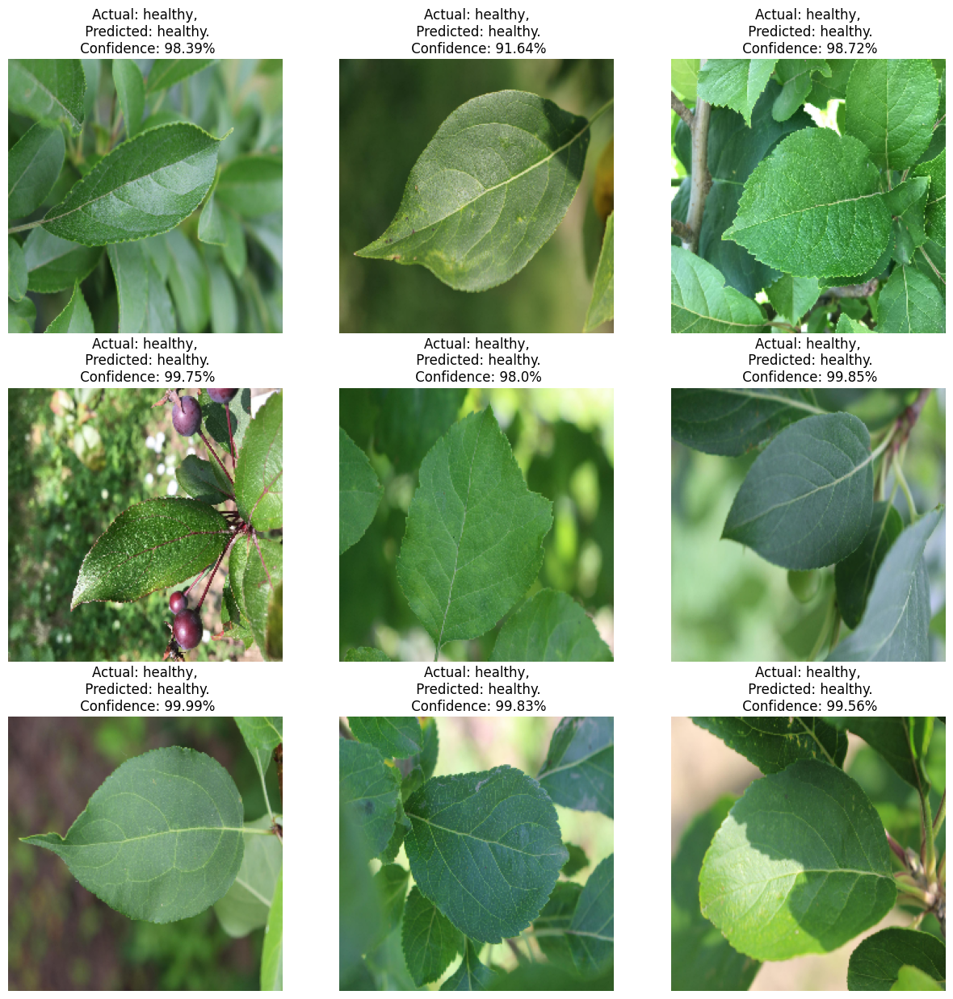

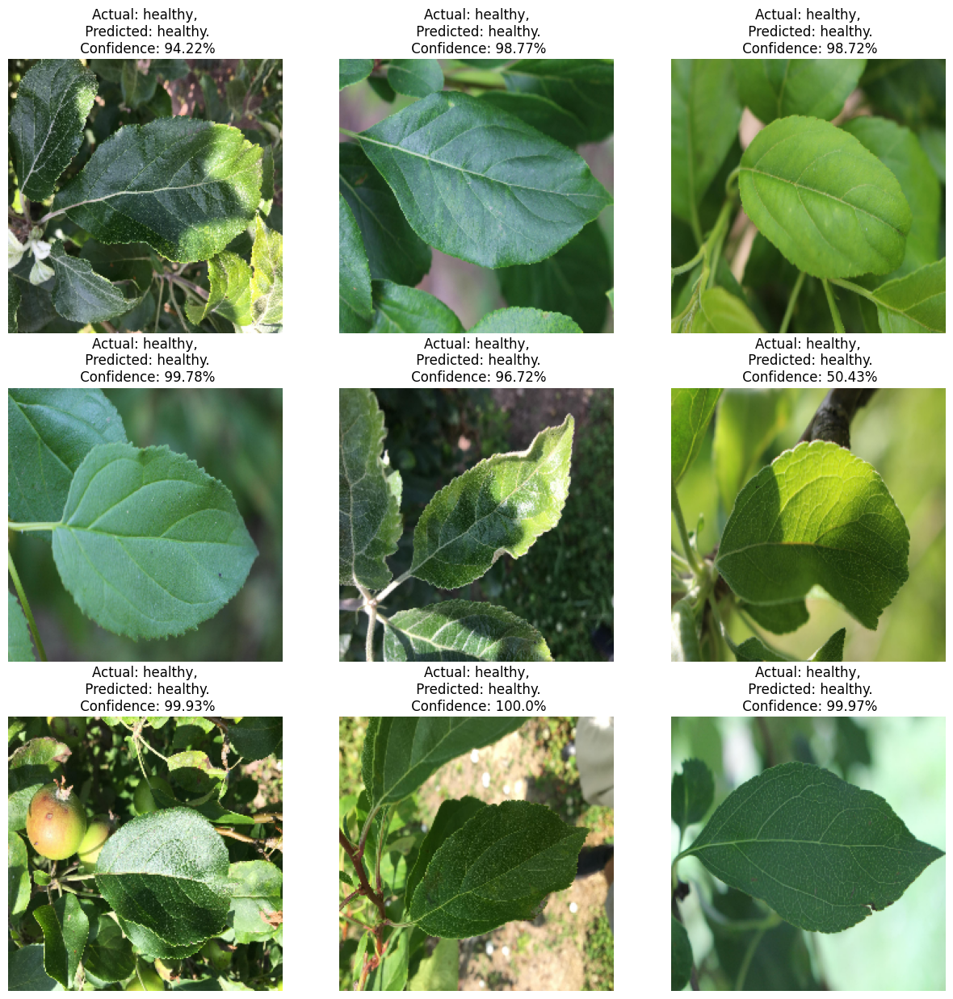

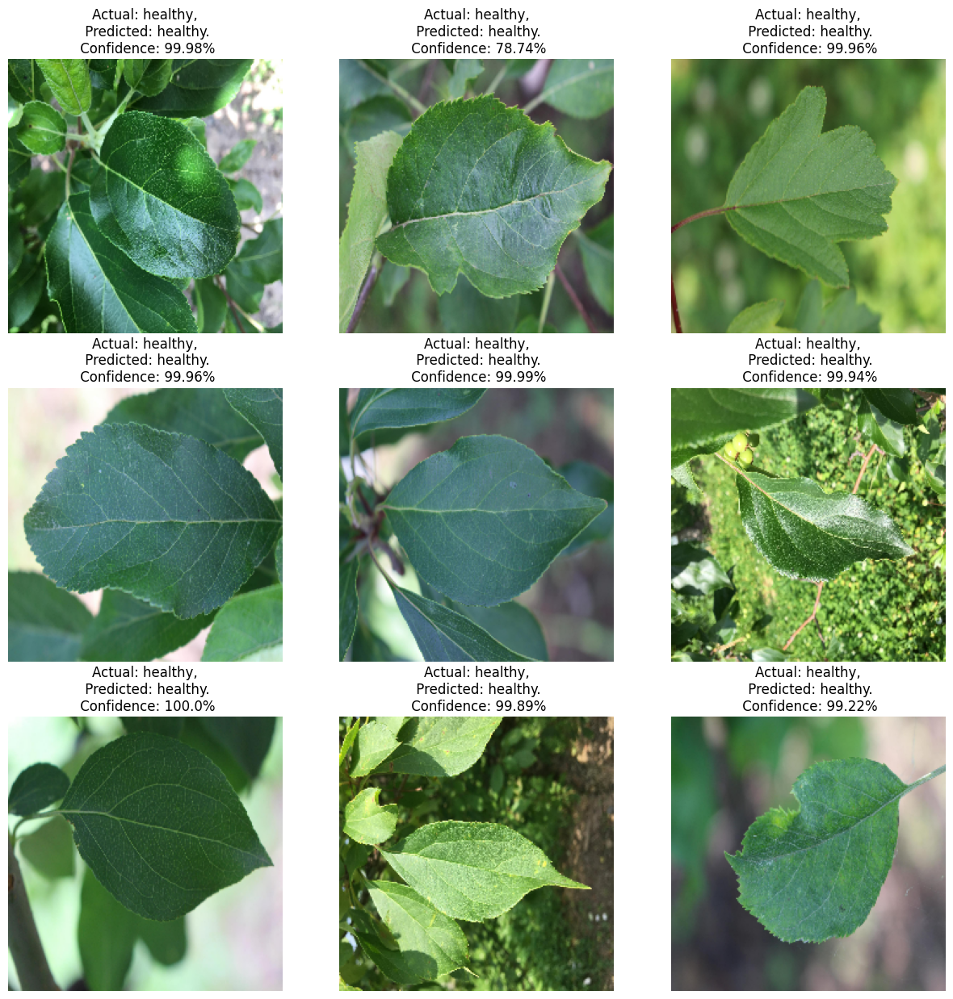

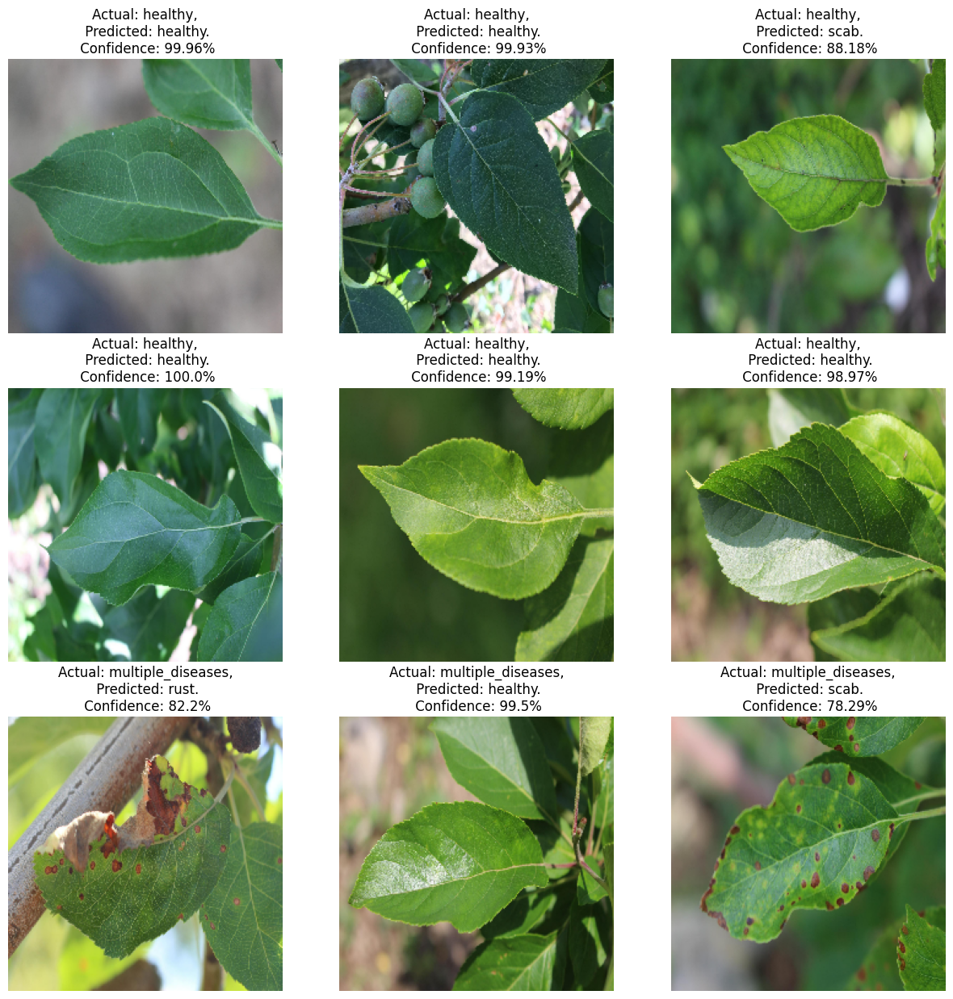

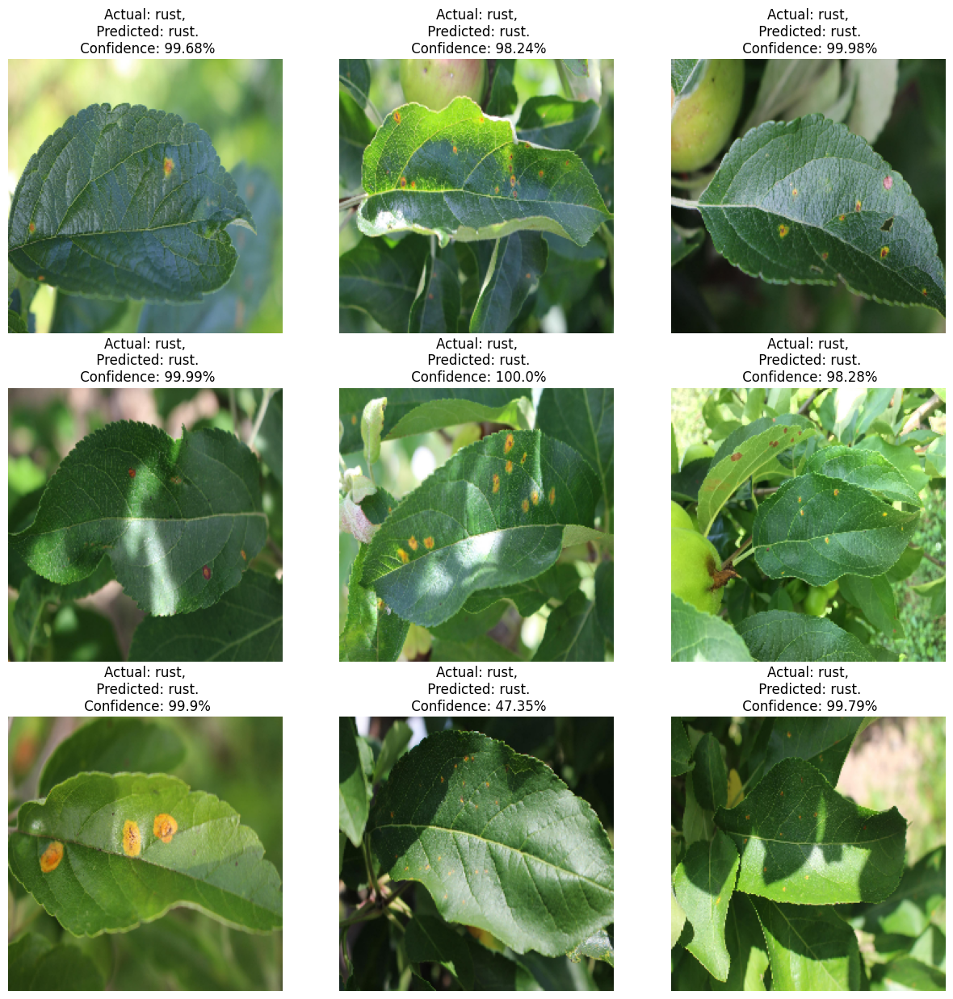

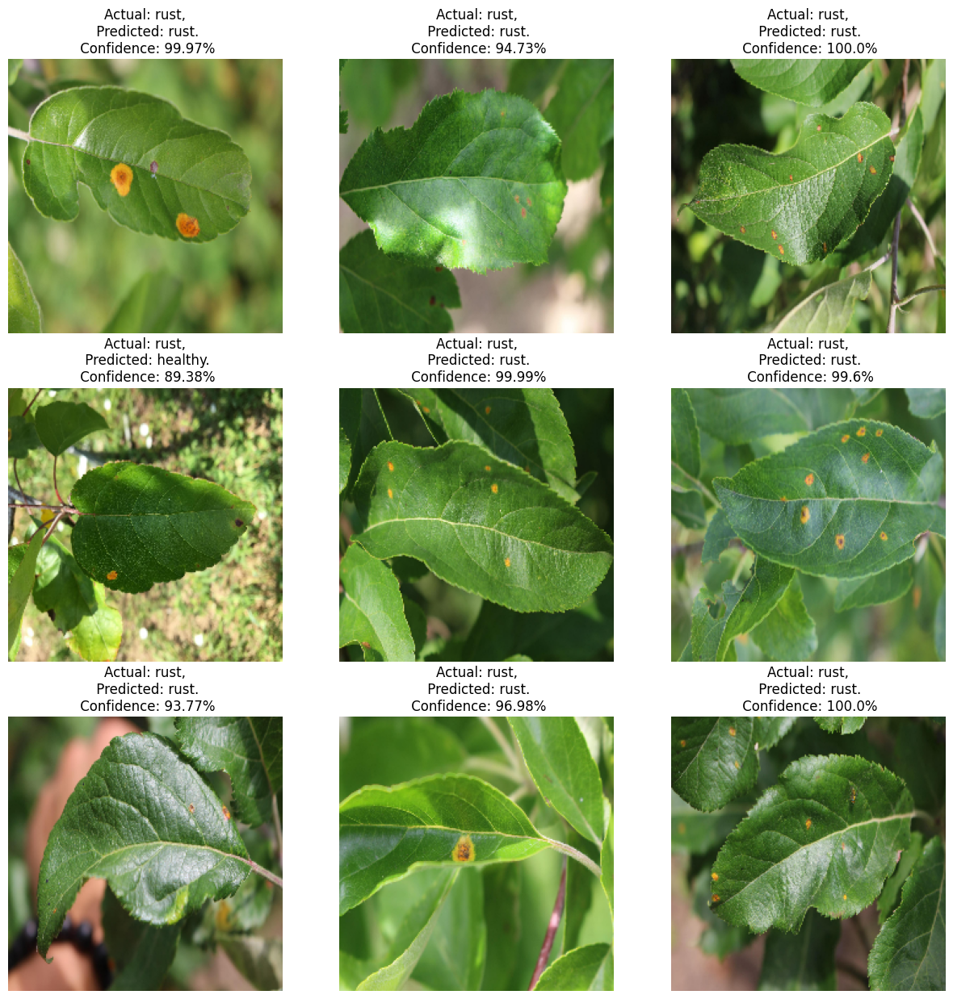

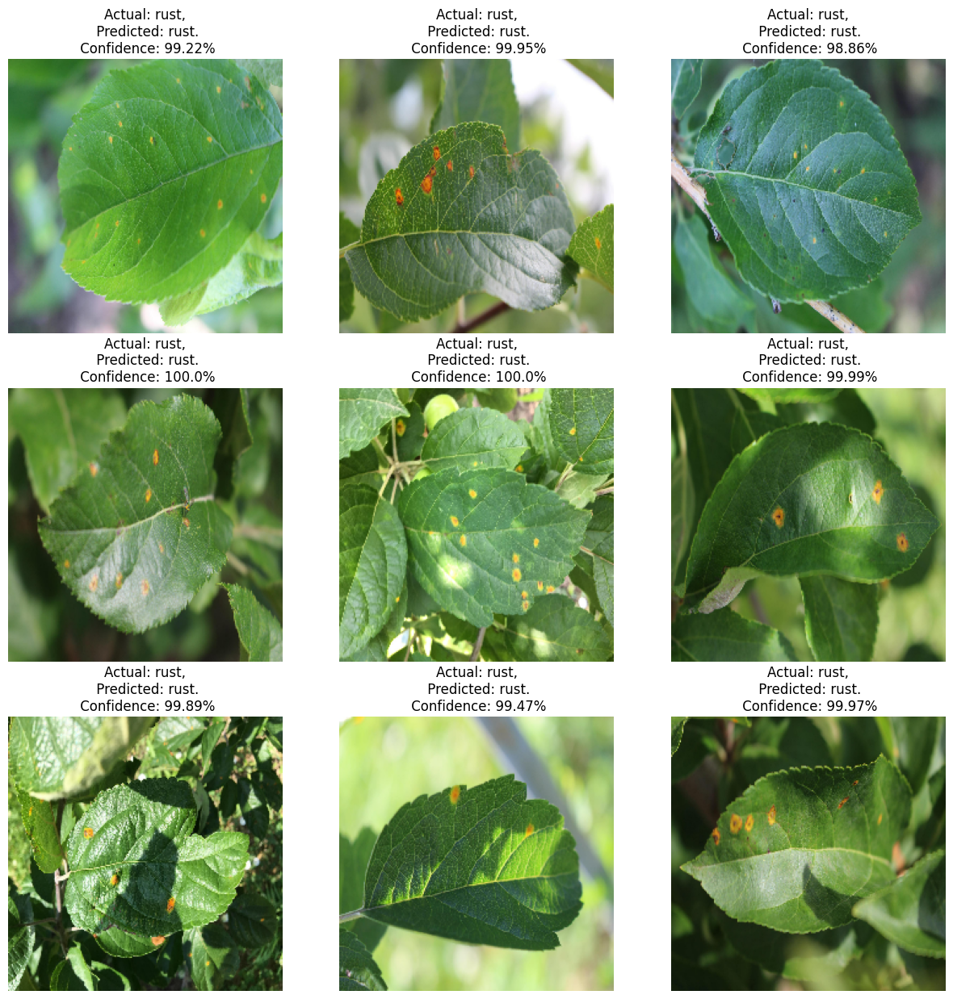

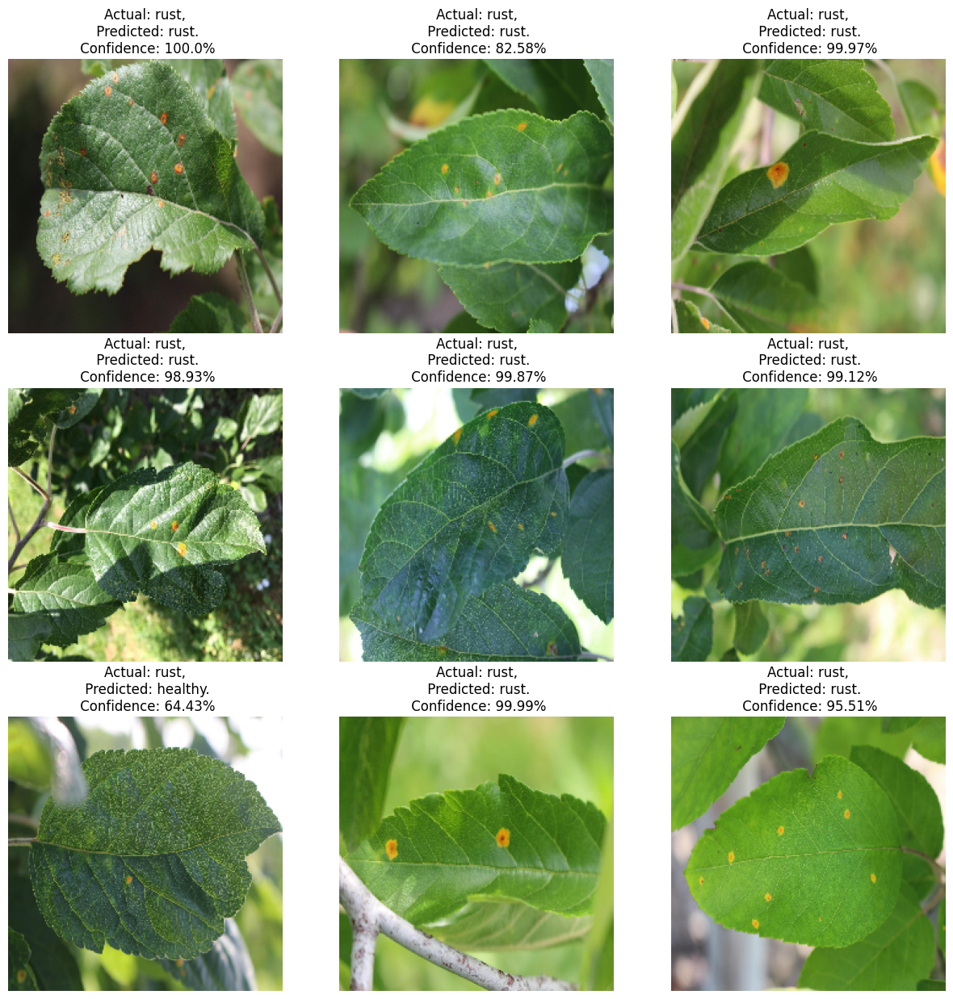

In [ ]:
import tensorflow as tf
import numpy as np
import matplotlib.pyplot as plt
from tensorflow.keras.preprocessing import image_dataset_from_directory

def predict(model, img):
    # Convert the image to a NumPy array and add a batch dimension
    img_array = tf.keras.preprocessing.image.img_to_array(img)
    img_array = tf.expand_dims(img_array, 0)

    # Make predictions using the model
    predictions = model.predict(img_array)

    # Get the predicted class and confidence
    predicted_class = class_names[np.argmax(predictions[0])]
    confidence = round(100 * (np.max(predictions[0])), 2)
    return predicted_class, confidence

# Path to the validation dataset
test_ds_path = '/content/drive/MyDrive/Classifier2/validation'

# Load the validation dataset using image_dataset_from_directory
val = image_dataset_from_directory(
    test_ds_path,
    shuffle=False,
    batch_size=32,
    image_size=(img_height, img_width)
)

# Get class names from the validation dataset
class_names = val.class_names

# Iterate through the first 8 batches of the validation dataset
for images, labels in val.take(8):
    plt.figure(figsize=(15, 15))
    # Iterate through the images in the current batch
    for i in range(9):
        ax = plt.subplot(3, 3, i + 1)
        plt.imshow(images[i].numpy().astype("uint8"))

        # Make predictions for the current image
        predicted_class, confidence = predict(transfer_model, images[i].numpy())
        actual_class = class_names[labels[i]]

        # Display image title with actual class, predicted class, and confidence
        plt.title(f"Actual: {actual_class},\n Predicted: {predicted_class}.\n Confidence: {confidence}%")

        plt.axis("off")

plt.show()


In [ ]:

!pip install keras-tuner


Hyperparameter Tuning for base model

In [ ]:
from tensorflow.keras.layers import CenterCrop
from tensorflow.keras.layers import Rescaling
from kerastuner.tuners import RandomSearch
from kerastuner.tuners import Hyperband

# Define the function to create the model with hyperparameters
def create_model(hp):
    # Define the model architecture using hyperparameters
    model = tf.keras.models.Sequential([
        keras.Input(shape=(None, None, 3)),
        data_augmentation,
        CenterCrop(height=img_height, width=img_width),
        tf.keras.layers.Conv2D(hp.Int('conv1_units', min_value=16, max_value=64, step=16), (3, 3), strides=2, activation="relu"),
        tf.keras.layers.Conv2D(hp.Int('conv2_units', min_value=16, max_value=64, step=16), (3, 3), strides=2, activation="relu"),
        tf.keras.layers.Conv2D(hp.Int('conv3_units', min_value=16, max_value=64, step=16), (3, 3), strides=2, activation="relu"),
        tf.keras.layers.Flatten(),
        tf.keras.layers.Dense(hp.Int('dense1_units', min_value=64, max_value=512, step=64), activation="relu"),
        tf.keras.layers.Dropout(hp.Float('dropout1', min_value=0.2, max_value=0.5, step=0.1)),
        tf.keras.layers.Dense(hp.Int('dense2_units', min_value=64, max_value=512, step=64), activation="relu"),
        tf.keras.layers.Dropout(hp.Float('dropout2', min_value=0.2, max_value=0.5, step=0.1)),
        tf.keras.layers.Dense(num_classes, activation="softmax")
    ])

    # Compile the model with specified optimizer, loss, and metrics
    model.compile(optimizer='adam',
                  loss='categorical_crossentropy',
                  metrics=['accuracy'])

    return model

# Apply hyperparameter tuning using BayesianOptimization tuner
tuner = BayesianOptimization(
    create_model,
    objective='val_accuracy',
    max_trials=5,
    num_initial_points=2,
    directory='tuner_directory',
    project_name='my_hyperparameter_tuning',
    overwrite=True
)

# Search for the best hyperparameters by training on the provided datasets
tuner.search(train_ds,
             epochs=10,
             validation_data=val_ds)

# Retrieve the best model and its hyperparameters
best_model = tuner.get_best_models(num_models=1)[0]
best_hyperparameters = tuner.oracle.get_best_trials(num_trials=1)[0].hyperparameters.values

# Print the best hyperparameters found
print("Best Hyperparameters:", best_hyperparameters)


Trial 5 Complete [00h 00m 15s]
val_accuracy: 0.5773480534553528

Best val_accuracy So Far: 0.5773480534553528
Total elapsed time: 00h 01m 22s
Best Hyperparameters: {'conv1_units': 48, 'conv2_units': 16, 'conv3_units': 16, 'dense1_units': 192, 'dropout1': 0.4, 'dense2_units': 64, 'dropout2': 0.4}


## Test The Model

In [ ]:
import tensorflow as tf
from tensorflow.keras.models import load_model
from tensorflow.keras.preprocessing.image import ImageDataGenerator

test_data_dir = '/content/drive/MyDrive/test'

test_datagen = ImageDataGenerator()

batch_size = 16

test_generator = test_datagen.flow_from_directory(
    test_data_dir,
    target_size=(224, 224),
    batch_size=batch_size,
    class_mode='categorical'
)
# Evaluate the transfer_model using the test_generator
evaluation = transfer_model.evaluate(test_generator)

print("Test Loss:", evaluation[0])
print("Test Accuracy:", evaluation[1])


Found 329 images belonging to 4 classes.
21/21 [==============================] - 193s 9s/step - loss: 0.3761 - accuracy: 0.9027
Test Loss: 0.3761238753795624
Test Accuracy: 0.9027355909347534


### Reference To Dataset

- https://www.kaggle.com/c/plant-pathology-2020-fgvc7/overview